# A method for classifying hydrological alteration

In [1]:
from hidrocomp.series import Flow
import math
import pandas as pd
import plotly as py

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [3]:
flow_ons.month_num_flood, flow_ons.month_abr_flood

(8, 'AS-AUG')

In [4]:
flow = flow_ana.data.combine_first(flow_sar.data).combine_first(flow_ons.data)
flow

,66160000,66231000,A19086,D19086,MANSO
1972-08-07,11.2110,NaN,NaN,NaN,NaN
1972-08-08,11.2110,NaN,NaN,NaN,NaN
1972-08-09,11.6272,NaN,NaN,NaN,NaN
1972-08-10,11.6272,NaN,NaN,NaN,NaN
1972-08-11,11.6272,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-07-18,NaN,NaN,41.94,121.0,NaN
2020-07-19,NaN,NaN,34.02,121.0,NaN
2020-07-20,NaN,NaN,41.93,121.0,NaN
2020-07-21,NaN,NaN,34.02,121.0,NaN


In [5]:
flow = Flow(data=flow)

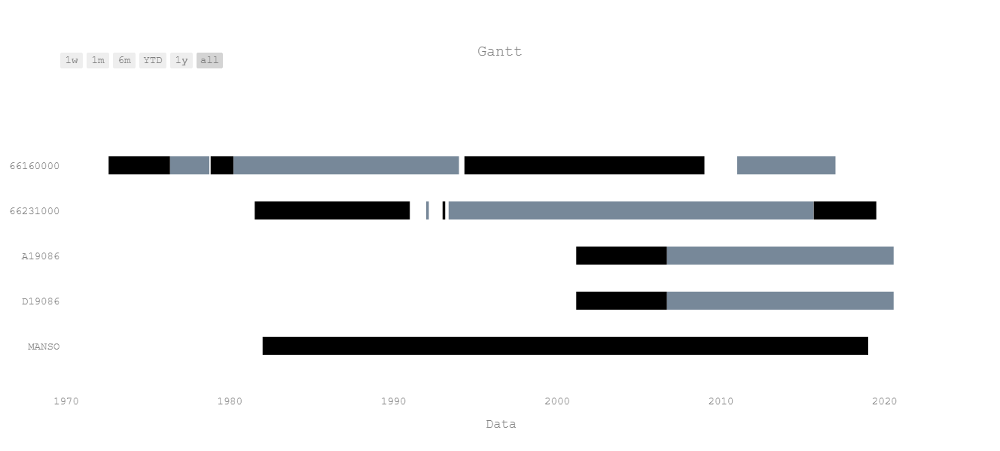

In [6]:
fig_gantt, data_gantt = flow.gantt("Gantt")
py.offline.iplot(fig_gantt)

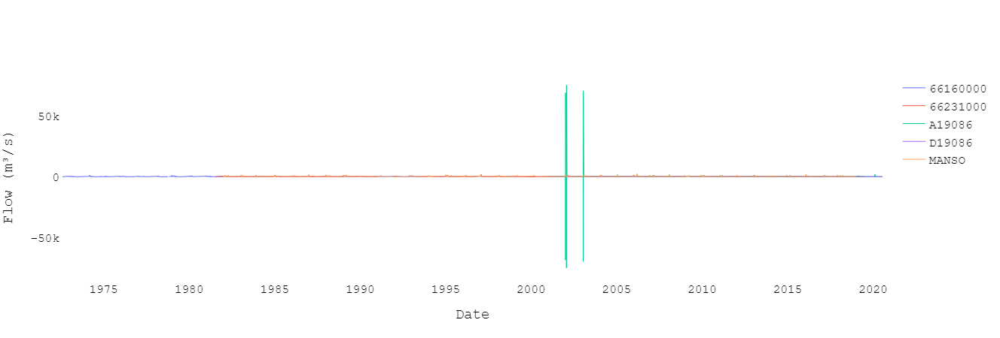

In [7]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

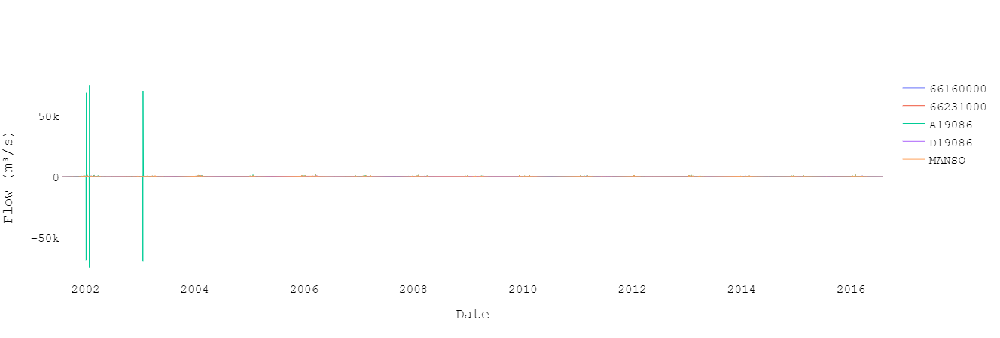

In [8]:
start_filling = "01/08/2001"
end_filling = "31/07/2016"
flow.date(date_start=start_filling, date_end=end_filling)
fig_start_filling_hydro, data_start_filling_hydro = flow.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

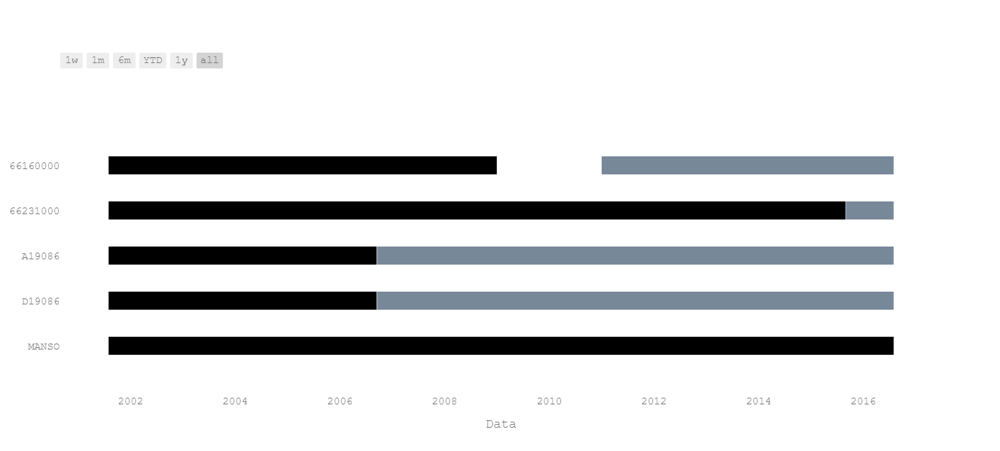

In [9]:
fig_start_filling_gantt, data_start_filling_gantt = flow.gantt("")
py.offline.iplot(fig_start_filling_gantt)

## Interpolar dados

In [10]:
nulls = flow.data["66231000"].isnull()
date_start = flow.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow.data.loc[nulls].index[0]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow.data["66231000"][date] = flow.data["D19086"][date] + delta
    delta = flow.data["66231000"][date] - flow.data["D19086"][date]
    
flow.data["66231000"][date_end]

120.083

# Control x Impact

In [11]:
area_sb = 4260
area_ss = 9580
f"66160000: {area_sb} km²  66231000: {area_ss} km²"

'66160000: 4260 km²  66231000: 9580 km²'

In [12]:
alpha = area_ss/area_sb
alpha

2.248826291079812

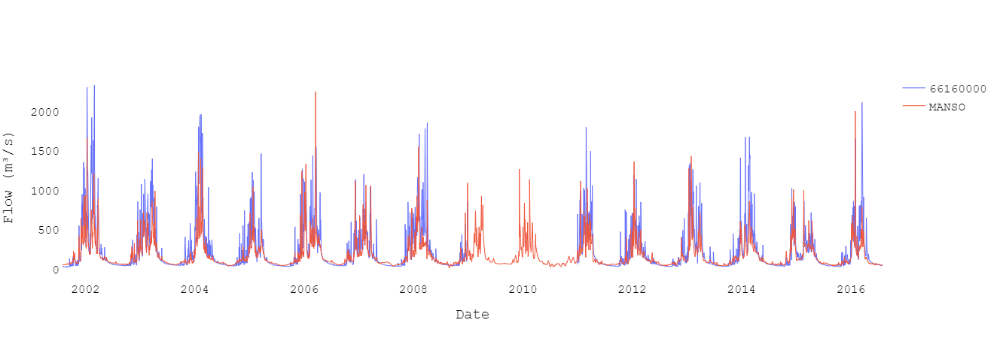

In [13]:
data_mod = pd.DataFrame(flow.data["66160000"]*alpha)
data = data_mod.combine_first(pd.DataFrame(flow.data["MANSO"]))
data = Flow(data=data)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

### Menor cheia

In [14]:
data.station = "66160000"
data.date(date_start="01/09/2001")
data_max = data.maximum()
threshold_high = data_max.peaks.min().values[0]
f"Threshold: {threshold_high}"

'Threshold: 850.285718309859'

### Maior estagem 

In [15]:
data_min = data.minimum()
threshold_low = data_min.peaks.max().values[0]
f"Threshold: {threshold_low}"

'Threshold: 59.48123051643192'

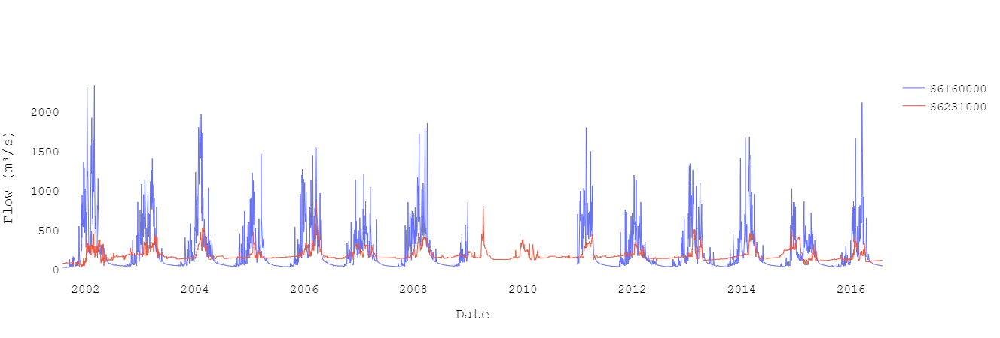

In [16]:
data_mod = pd.DataFrame(flow.data["66160000"]*alpha)
data = data_mod.combine_first(pd.DataFrame(flow.data["66231000"]))
data = Flow(data=data)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

# Parte 1

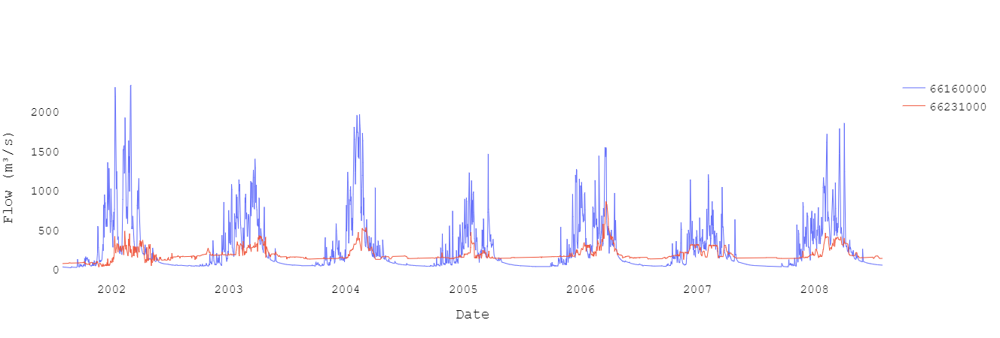

In [17]:
date_end = "31/07/2008"
data.date(date_end=date_end)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

## Station 66160000

In [18]:
data.station = "66160000"
f"Hydrological year start month: {data.month_abr_flood}"

'Hydrological year start month: AS-AUG'

## Iha

In [19]:
# converte km² para milhas
area_ss_mile = area_ss * 0.386102

In [20]:
duration = math.ceil(5 + math.log(area_ss_mile))

In [21]:
duration

14

In [22]:
iha_pre = data.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="duration_and_xmin", duration=duration)

In [23]:
iha_pre.summary()

{'duration': 14}


,Coeff. of Var.,Means
January,175.257705,597.580328
February,344.461041,740.517247
March,216.697995,555.442893
April,108.171113,276.390922
May,22.544512,108.930343
June,10.655203,66.401170
July,6.319589,51.041136
August,7.870057,39.710901
September,4.668703,39.876729
October,28.461066,77.665335


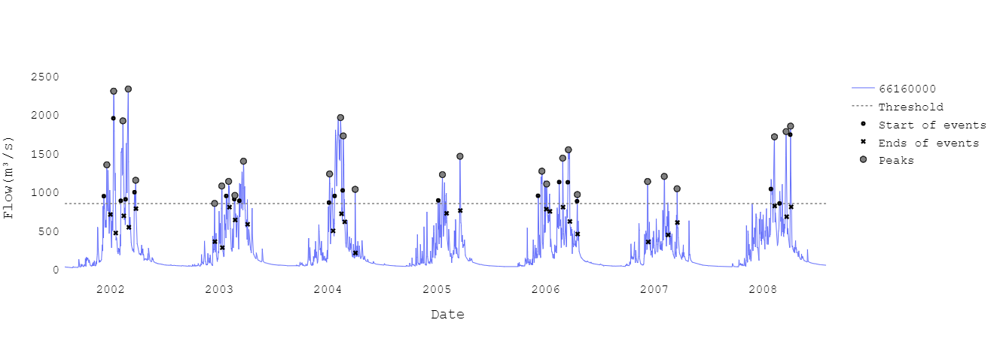

In [24]:
fig_events_high, data_events_high = iha_pre.frequency_and_duration.events_high.hydrogram("")
py.offline.iplot(fig_events_high)

In [25]:
iha_pre.frequency_and_duration.events_high.peaks

,Duration,Start,End,peaks
2001-12-20,22,2001-12-10,2002-01-01,1351.888671
2002-01-12,8,2002-01-11,2002-01-19,2305.114413
2002-02-12,10,2002-02-05,2002-02-15,1921.206033
2002-03-02,11,2002-02-21,2002-03-04,2332.932394
2002-03-27,5,2002-03-23,2002-03-28,1151.950023
2002-12-17,1,2002-12-17,2002-12-18,852.620000
2003-01-10,2,2003-01-10,2003-01-12,1078.055840
2003-02-02,11,2003-01-25,2003-02-05,1137.622751
2003-02-23,3,2003-02-21,2003-02-24,956.039023
2003-03-24,28,2003-03-10,2003-04-07,1398.673254


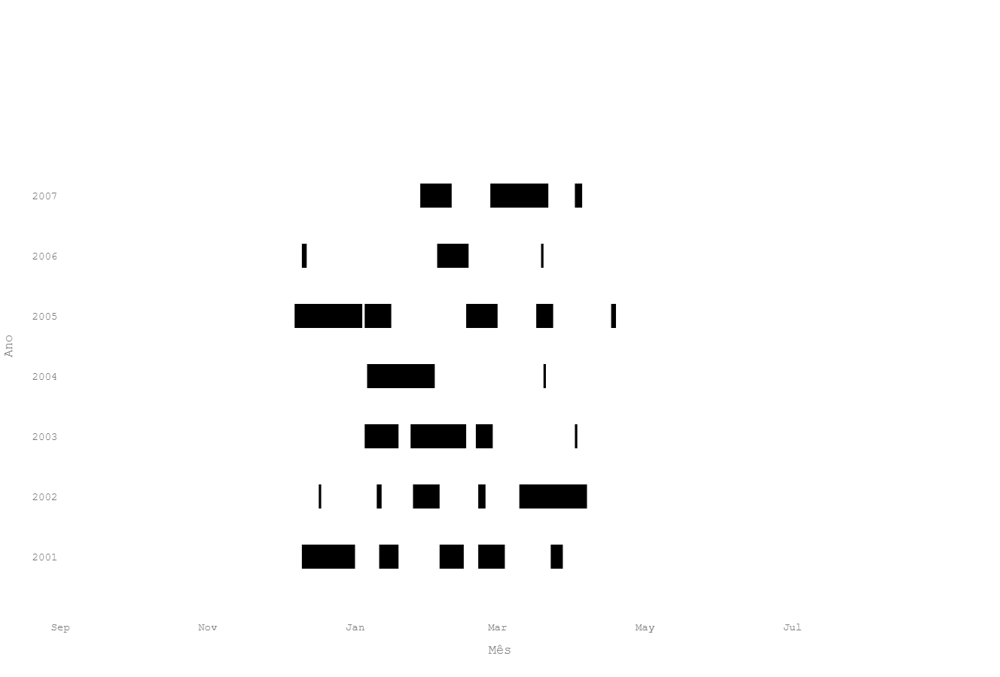

In [26]:
fig_events_spells_high, data_events_spells_high = iha_pre.frequency_and_duration.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high)

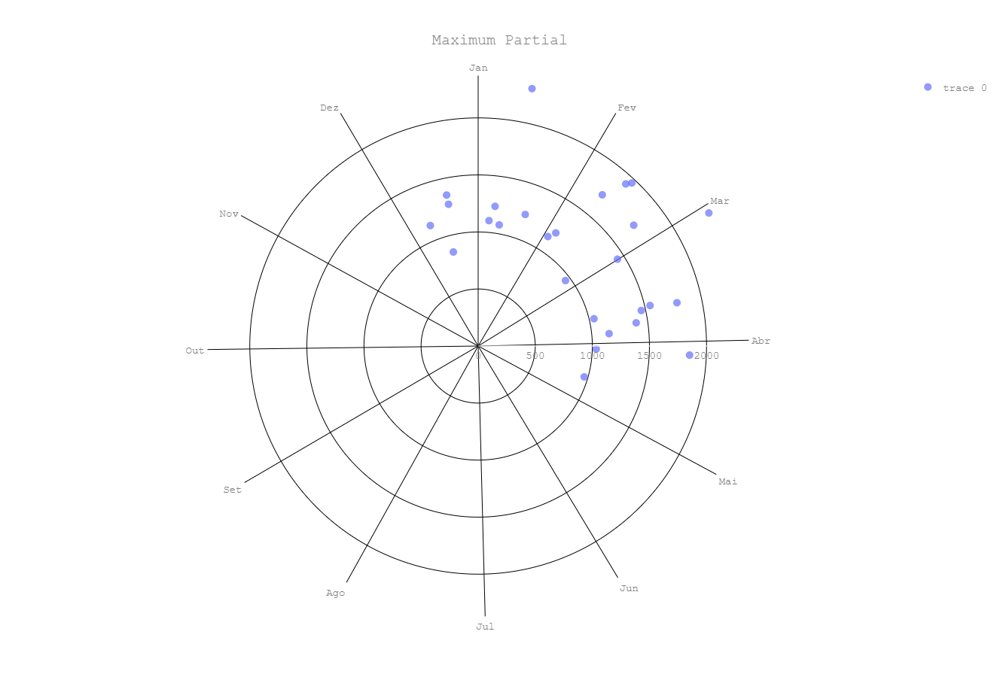

In [27]:
fig_events_polar_high, data_events_polar_high = iha_pre.frequency_and_duration.events_high.polar("")
py.offline.iplot(fig_events_polar_high)

## Station 66231000

In [28]:
data.station = "66231000"
iha_pos = data.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low)

In [29]:
iha_pos.summary()

{}


,Coeff. of Var.,Means
January,24.207049,230.702692
February,67.077049,281.418212
March,111.307846,299.998433
April,80.537069,229.850590
May,21.615262,158.547587
June,13.880511,148.737800
July,3.638594,149.377954
August,28.231827,137.491982
September,26.574386,136.427778
October,37.954201,146.632897


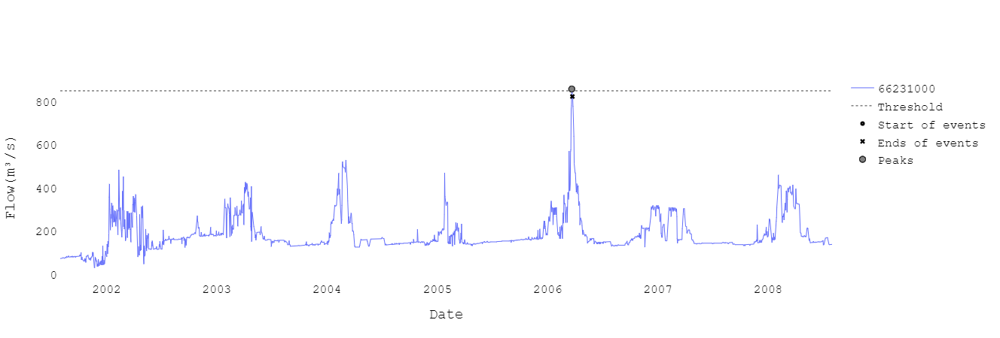

In [30]:
fig_events_high_pos, data_events_high_pos = iha_pos.frequency_and_duration.events_high.hydrogram("")
py.offline.iplot(fig_events_high_pos)

e:\projetos\hidrocomp\venv\lib\site-packages\hidrocomp\graphics\gantt.py:44: RuntimeWarning:

invalid value encountered in double_scalars



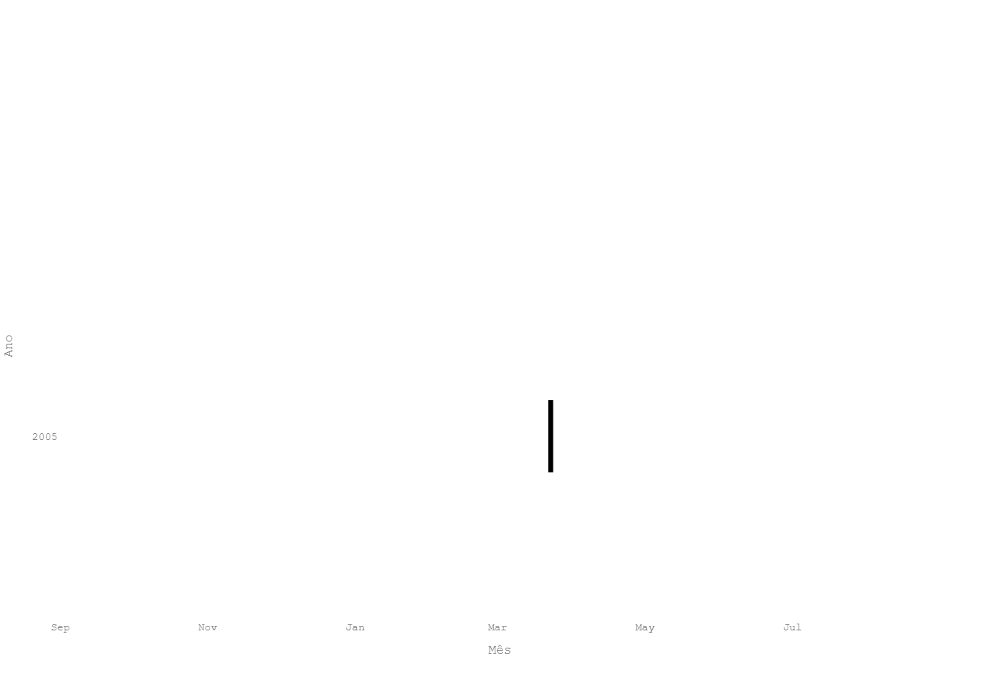

In [31]:
fig_events_spells_high_pos, data_events_spells_high_pos = iha_pos.frequency_and_duration.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high_pos)

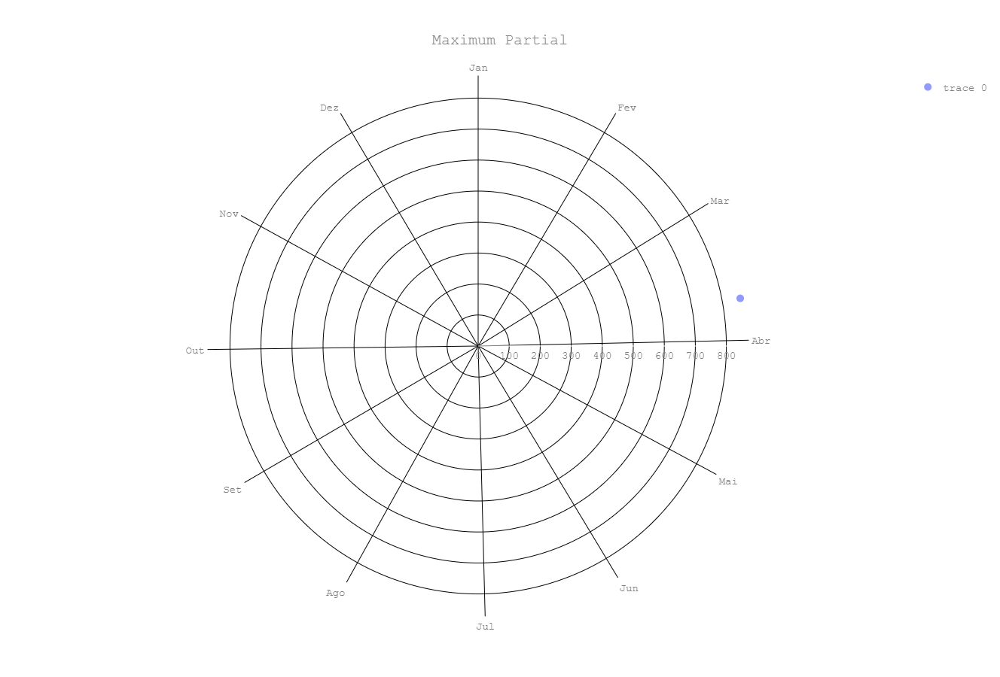

In [32]:
fig_events_polar_high_pos, data_events_polar_high_pos = iha_pos.frequency_and_duration.events_high.polar("")
py.offline.iplot(fig_events_polar_high_pos)

In [33]:
cha = iha_pre.cha(iha_obs=iha_pos)

In [34]:
cha.point

,Mean,Std
Frequency and Duration,1,1
Magnitude,3,0
Magnitude and Duration,3,0
Rate and Frequency,1,0
Timing Extreme,0,1
